**Hello Dashtoon!**

One way to generate new paintings is to **transfer the style of the target artist  to already existings images of real life**. Here I randomly picked a real life image and converted it using the painting style of any Base Image.

**Problem Statement** - To Create a deep learning model capable of adapting an existing work to resemble the aesthetic of any art. The model should be able to analyze the artistic style of the selected art and apply similar stylistic features to a new, original artwork, creating a piece that seems as though it could have been created by the artist themselves.

**Neural style transfer** is an optimization technique used to take two images—a content image and a style reference image (such as an artwork by a famous painter)—and blend them together so the output image looks like the content image, but “painted” in the style of the style reference image.
This is implemented by optimizing the output image to match the content statistics of the content image and the style statistics of the style reference image. These statistics are extracted from the images using a convolutional network.

Convolutional Neural Networks (CNNs) do not inherently understand what an image represents, but they learn to encode the content that a specific image conveys. This encoding characteristic of CNNs is pivotal in Neural Style Transfer.

In the context of Neural Style Transfer, we employ the VGG19 network. This network is a convolutional neural network that has been trained on over a million images from the ImageNet database, making it capable of detecting high-level features in an image. The network is 19 layers deep, and its training on such a large dataset is what enables it to capture these high-level features.

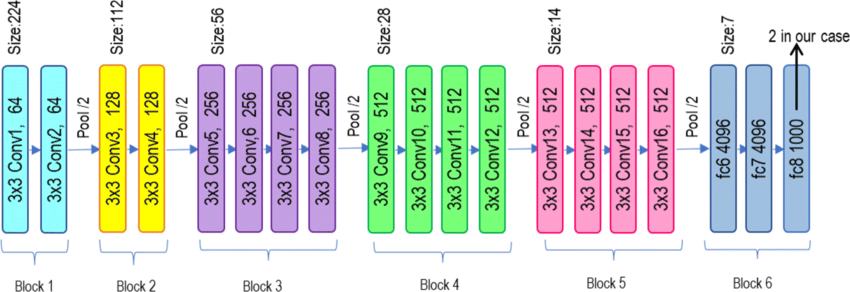

**Architecture of VGG19 Model that we shall use**

The 'encoding nature' of CNNs is the key to Neural Style Transfer. We begin by initializing a noisy image, which will be our output image. We then measure how similar this image is to the content and style image at a specific layer in the network (VGG network). Since our goal is to have the output image  mirror the content of the content image and the style of the style image, we calculate the loss of the generated image
 relative to the content and style image. This process allows us to iteratively refine the output image until it closely matches the desired content and style.

In [1]:
import matplotlib.pyplot as plt #Importing Libraries
import tensorflow as tf
import numpy as np
tf.__version__

'2.14.0'

In [2]:
network = tf.keras.applications.VGG19(include_top=False, weights='imagenet') #Loading up the VGG19 Model

80134624/80134624 [==============================] - 2s 0us/step


In [3]:
network.summary() ## Taking a look at the model summary

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [4]:
len(network.layers) ## number of layers

22

# Loading and pre-processing the images

## Content image

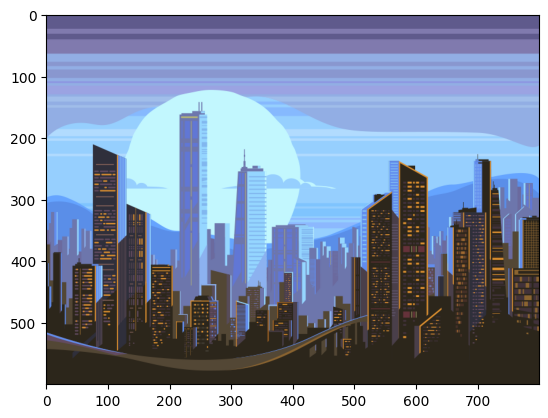

In [5]:
import cv2
import pandas as pd
content_image = cv2.imread('content.png')  ## Taking a look at the content base image
plt.imshow(content_image)
plt.show()

In [6]:
type(content_image), content_image.shape, content_image.min(), content_image.max()

(numpy.ndarray, (600, 800, 3), 27, 255)

In [7]:
content_image = content_image / 255 # Scaling the image
content_image.min(), content_image.max()

(0.10588235294117647, 1.0)

In [8]:
# content_image

In [9]:
content_image = content_image[tf.newaxis, :]
content_image.shape

(1, 600, 800, 3)

## Style image

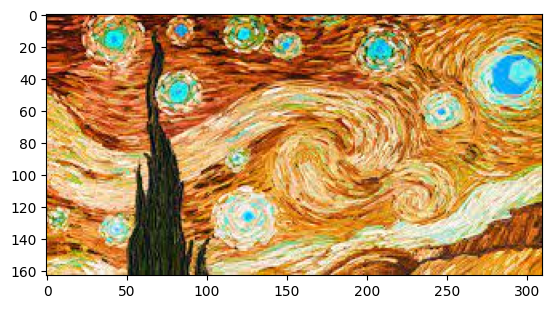

In [10]:
style_image = cv2.imread('style.jpg') # Stype image from which we would like to take in the style
plt.imshow(style_image)
plt.show()

In [11]:
style_image = style_image / 255
style_image = style_image[tf.newaxis, :]
style_image.shape

(1, 163, 310, 3)

# Building the neural network

In [12]:
# We now select the layers which we would like to have for style transfer
content_layers = ['block4_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

In [13]:
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)
print(num_content_layers, num_style_layers)

1 5


In [14]:
[network.get_layer(name).output for name in style_layers]

[<KerasTensor: shape=(None, None, None, 64) dtype=float32 (created by layer 'block1_conv1')>,
 <KerasTensor: shape=(None, None, None, 128) dtype=float32 (created by layer 'block2_conv1')>,
 <KerasTensor: shape=(None, None, None, 256) dtype=float32 (created by layer 'block3_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block4_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv1')>]

In [15]:
network.input

<KerasTensor: shape=(None, None, None, 3) dtype=float32 (created by layer 'input_1')>

In [16]:
# function for loading the layers of model
def vgg_layers(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]
    network = tf.keras.Model(inputs = [vgg.input], outputs = outputs)

    return network

In [17]:
style_extractor = vgg_layers(style_layers)
style_extractor.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [18]:
style_extractor.outputs

[<KerasTensor: shape=(None, None, None, 64) dtype=float32 (created by layer 'block1_conv1')>,
 <KerasTensor: shape=(None, None, None, 128) dtype=float32 (created by layer 'block2_conv1')>,
 <KerasTensor: shape=(None, None, None, 256) dtype=float32 (created by layer 'block3_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block4_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv1')>]

In [19]:
style_outputs = style_extractor(style_image)
len(style_outputs)

5

In [20]:
# style_outputs[1]

In [21]:

style_outputs[0].shape, style_outputs[1].shape, style_outputs[2].shape, style_outputs[3].shape, style_outputs[4].shape

(TensorShape([1, 163, 310, 64]),
 TensorShape([1, 81, 155, 128]),
 TensorShape([1, 40, 77, 256]),
 TensorShape([1, 20, 38, 512]),
 TensorShape([1, 10, 19, 512]))

**Content Loss**

Calculating content loss means how similar is the randomly generated noisy image to the content image.In order to calculate content loss :

Assume that we choose a hidden layer in a pre-trained network(VGG network) to compute the loss.Therefore, let P and F be the original image and the image that is generated.And, F[l] and P[l] be feature representation of the respective images in layer L

Content Loss = 1/2  Σ (Fij-Pij)^2


**Style Loss**

In order to capture the style of an image we would calculate how correlated these filters are to each other meaning how similar are these feature maps.

In-order to calculate a correlation between different filters or channels we calculate the dot-product between the vectors of the activations of the two filters.The matrix thus obtained is called **Gram Matrix**.

In [22]:
#We now make a function to find the gram matrix
def gram_matrix(layer_activation):
    result = tf.linalg.einsum('bijc,bijd->bcd', layer_activation, layer_activation)
    input_shape = tf.shape(layer_activation)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)

    return result / num_locations

In [23]:
# style_outputs[0]

In [24]:
gram_matrix(style_outputs[0])

<tf.Tensor: shape=(1, 64, 64), dtype=float32, numpy=
array([[[0.73154557, 0.53366965, 0.36993137, ..., 0.063481  ,
         0.3593636 , 0.4338982 ],
        [0.53366965, 0.55702347, 0.35761398, ..., 0.03366029,
         0.361578  , 0.37244403],
        [0.36993137, 0.35761398, 0.2500029 , ..., 0.01843238,
         0.2550717 , 0.27634957],
        ...,
        [0.063481  , 0.03366029, 0.01843238, ..., 0.04659995,
         0.04319503, 0.03877889],
        [0.3593636 , 0.361578  , 0.2550717 , ..., 0.04319503,
         0.32955667, 0.32561547],
        [0.4338982 , 0.37244403, 0.27634957, ..., 0.03877889,
         0.32561547, 0.35572422]]], dtype=float32)>

In [25]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super().__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    inputs = inputs * 255.0
    # 0 - 1
    # -127.50 - 127.50
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs) ## Preprocessed
    outputs = self.vgg(preprocessed_input)
    style_outputs = outputs[:self.num_style_layers]
    content_outputs = outputs[self.num_style_layers:]

    style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

    content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
    style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [26]:
style_layers, content_layers

(['block1_conv1',
  'block2_conv1',
  'block3_conv1',
  'block4_conv1',
  'block5_conv1'],
 ['block4_conv2'])

In [27]:
extractor = StyleContentModel(style_layers, content_layers)

In [28]:
results = extractor(content_image)
# results

In [29]:
# list(results)[0]

In [30]:
for key, value in results.items():
    print(key, value.keys())

content dict_keys(['block4_conv2'])
style dict_keys(['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1'])


In [31]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [32]:
len(style_targets), len(content_targets)

(5, 1)

In [33]:
new_image = tf.Variable(content_image)

In [34]:
#Providing weights for weight and style which shall be tuned for better results
content_weight = 1
style_weight = 100

In [35]:
optimizer = tf.optimizers.Adam(learning_rate=0.001)

In [36]:
expected_output = np.array([10000, 15000])
predictions = np.array([8000, 15900])

**Model Valuation** and **Analysis**

In [37]:
np.sum(abs(expected_output - predictions)) / 2

1450.0

In [38]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
mean_absolute_error(expected_output, predictions)

1450.0

In [39]:
mean_squared_error(expected_output, predictions)

2405000.0

In [40]:
((expected_output - predictions) ** 2).mean()

2405000.0

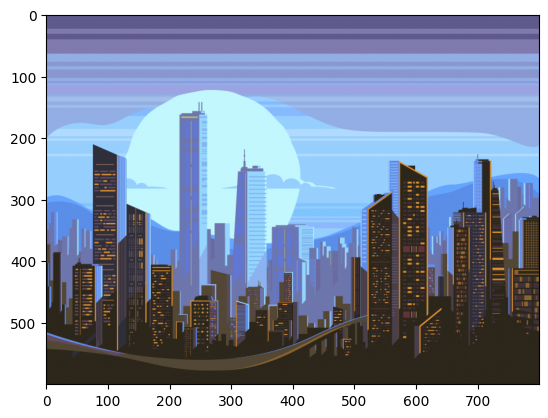

In [41]:
plt.imshow(tf.squeeze(content_image, axis = 0));

Epoch 500 | content loss: 974930.9375 | style loss: 12503825408.0 | total loss 250077495296.0


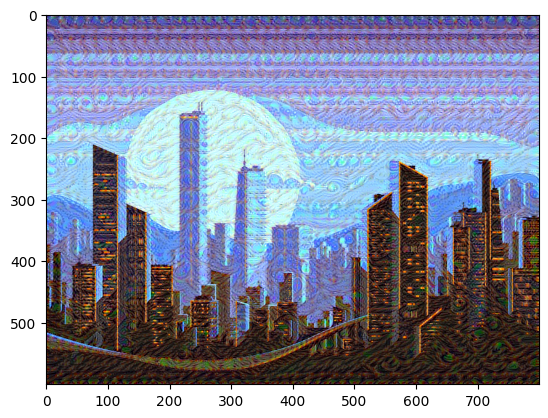

Epoch 1000 | content loss: 1049223.0 | style loss: 5189536768.0 | total loss 103791779840.0


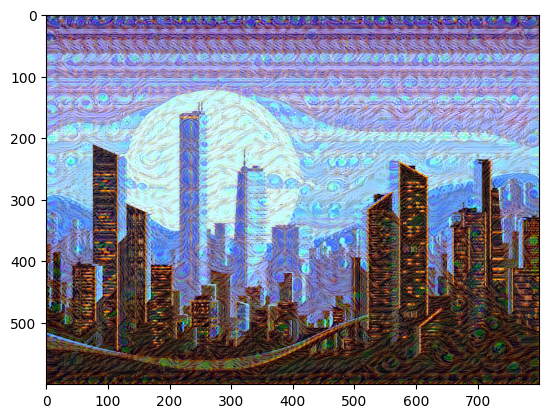

Epoch 1500 | content loss: 1087880.75 | style loss: 3277275392.0 | total loss 65546600448.0


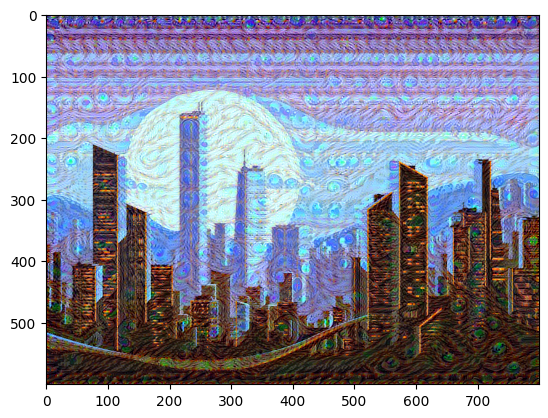

Epoch 2000 | content loss: 1113872.0 | style loss: 2397282816.0 | total loss 47946768384.0


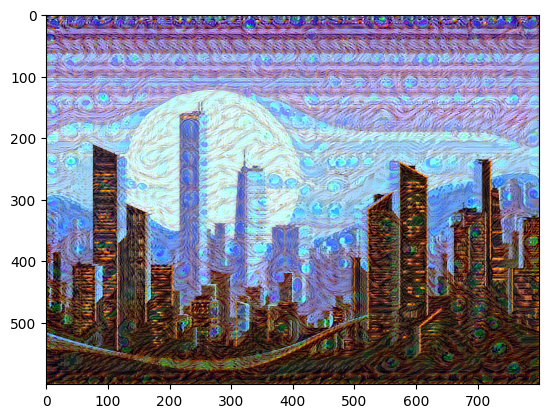

Epoch 2500 | content loss: 1133311.0 | style loss: 1886146048.0 | total loss 37724057600.0


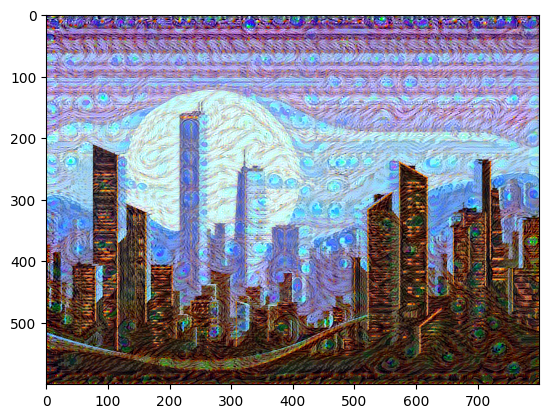

Epoch 3000 | content loss: 1148838.75 | style loss: 1545843200.0 | total loss 30918012928.0


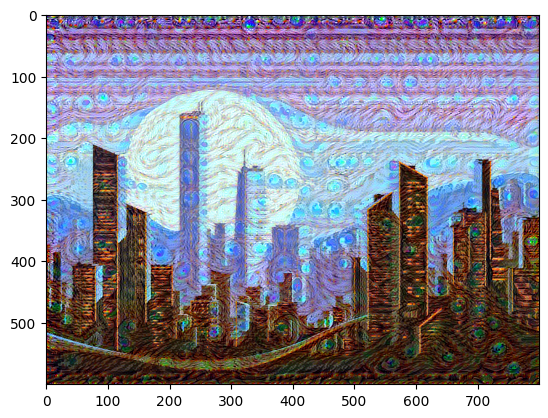

Epoch 3500 | content loss: 1162010.125 | style loss: 1296439040.0 | total loss 25929943040.0


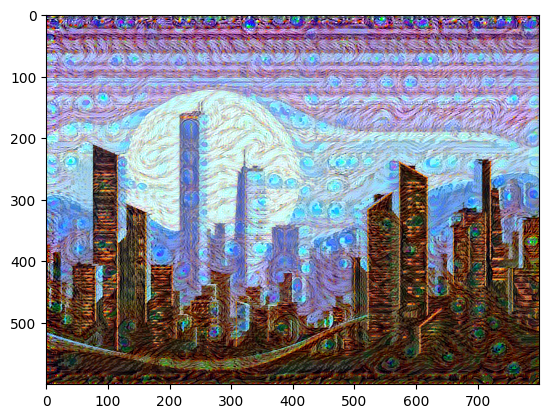

Epoch 4000 | content loss: 1173256.625 | style loss: 1103657728.0 | total loss 22074327040.0


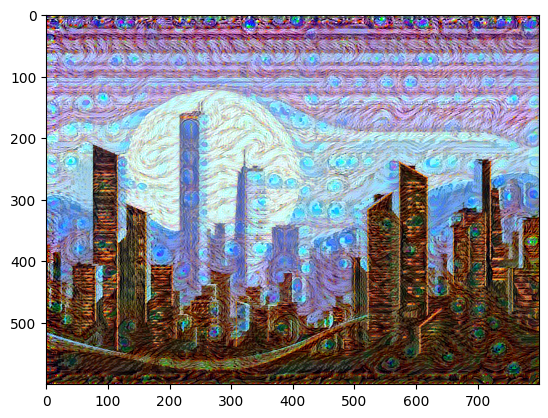

Epoch 4500 | content loss: 1183450.375 | style loss: 947001088.0 | total loss 18941206528.0


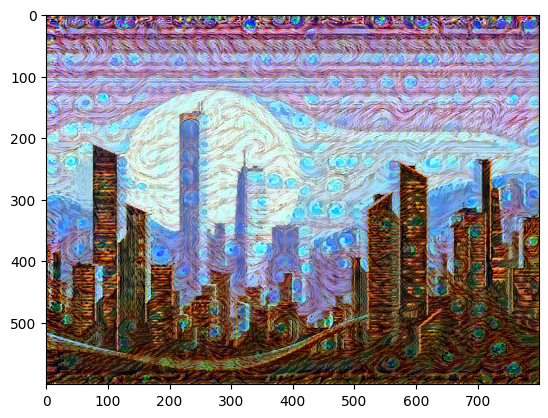

Epoch 5000 | content loss: 1193100.375 | style loss: 814429888.0 | total loss 16289790976.0


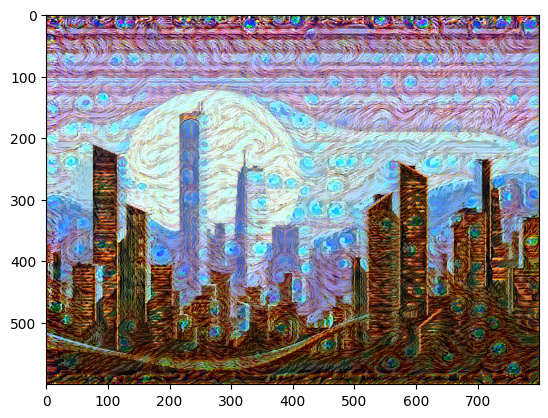

In [42]:
epochs = 5000
print_every = 500

for epoch in range(epochs):
  with tf.GradientTape() as tape:
    outputs = extractor(new_image)

    content_outputs = outputs['content']
    style_outputs = outputs['style']
    ## Here we define both content loss and style loss
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) for name in content_outputs.keys()])
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) for name in style_outputs.keys()])
    ## Caluclating the total loss
    total_loss = content_loss * content_weight / num_content_layers + style_loss * style_weight / num_style_layers

  gradient = tape.gradient(total_loss, new_image)
  optimizer.apply_gradients([(gradient, new_image)])

  new_image.assign(tf.clip_by_value(new_image, 0.0, 1.0))

  if (epoch + 1) % print_every == 0:
    print('Epoch {} | content loss: {} | style loss: {} | total loss {}'.format(epoch + 1, content_loss, style_loss, total_loss))
    plt.imshow(tf.squeeze(new_image, axis = 0))
    plt.show()

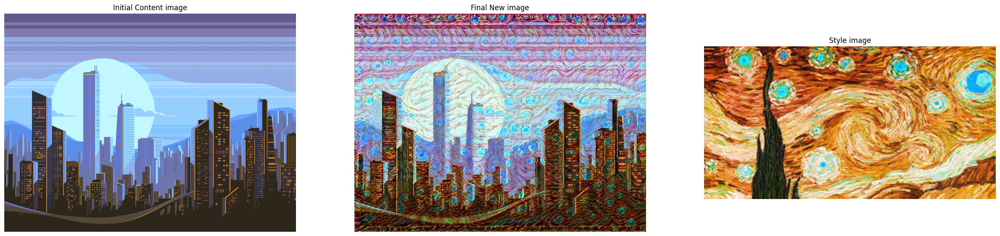

In [43]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,8))
ax1.axis('off')
ax1.imshow(tf.squeeze(content_image, axis = 0))
ax1.set_title('Initial Content image')
ax2.axis('off')
ax2.imshow(tf.squeeze(new_image, axis = 0))
ax2.set_title('Final New image')
ax3.axis('off')
ax3.imshow(tf.squeeze(style_image, axis = 0))
ax3.set_title('Style image');